In [1]:
cd "LAB 4"

c:\Users\Albert Roca\Documents\MCV\C4 3D\Project\LAB 4


C:\Users\Albert Roca\AppData\Roaming\Python\Python312\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import cv2
import sqlite3
from matplotlib import pyplot as plt
import numpy as np

from visualize_model import Model
from database import blob_to_array, pair_id_to_image_ids

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


# 1. 3D mesh reconstruction from a set of images from the Gerrard Hall dataset.
Install Colmap and run the automatic reconstruction on the Gerrard Hall dataset

# 2. Analyze reconstructions using python
## 2.1. Run the notebook, using the Gerrard Hall reconstruction (0.5)
#### <span style='color:Green'> - Add the path to your reconstruction. Answer the questions at the end  </span>

In [3]:
# Add your path
reconstruction_path = "./output/sparse/0"
database_path = "./output/database2.db"

#### Load an existing reconstruction and print its contents


In [4]:
model = Model()
model.read_model(reconstruction_path, ext='.bin') # Should also work with .txt

In [5]:
images = model.images
cameras = model.cameras
points3D = model.points3D

In [6]:
print(f"Loaded {len(images)} images. This is the information available for one of them:")
# print(images[1])
print(f"\nLoaded {len(cameras)} cameras. This is the information available for one of them:")
# print(cameras[1])
print(f"\nLoaded {len(points3D)} 3D points. This is the information available for one of them:")
# print(points3D[1])

Loaded 100 images. This is the information available for one of them:

Loaded 1 cameras. This is the information available for one of them:

Loaded 73169 3D points. This is the information available for one of them:


#### Load the database

In [7]:
db = sqlite3.connect(database_path)

In [8]:
keypoints = dict(
        (image_id, blob_to_array(data, np.float32, (-1, 2)))
        for image_id, data in db.execute(
            "SELECT image_id, data FROM keypoints"))

In [9]:
print(f"Loaded keypoints from {len(keypoints)} images. These are the {len(keypoints[1])} keypoints for one of them:")
print(keypoints[1])

Loaded keypoints from 100 images. These are the 26778 keypoints for one of them:
[[ 9.5192737e+02  9.8516205e+02]
 [ 4.3402548e+02  1.1125321e+02]
 [ 7.1436073e+01  8.7647430e+02]
 ...
 [ 5.4528857e+03  1.8148855e+03]
 [-7.8579456e-01  9.6306467e+00]
 [-6.5634856e+00  4.4450297e+00]]


In [10]:
matches = dict()
count_no_data = 0
for pair_id, data in db.execute("SELECT pair_id, data FROM matches"):
    if data is None:
        count_no_data += 1
    else:
        matches[pair_id_to_image_ids(pair_id)] = blob_to_array(data, np.uint32, (-1, 2))
print(f"Loaded {len(matches)} matches. {count_no_data}/{len(matches)+count_no_data} matches contained no data")

Loaded 2035 matches. 2915/4950 matches contained no data


In [11]:
print("These are the matches between two images:")
print(matches[1,2])

These are the matches between two images:
[[  18   17]
 [  20   27]
 [  21   28]
 ...
 [8899 5382]
 [8906 3500]
 [8924 8542]]


#### Visualize the point cloud and cameras

In [12]:
# model.create_window()
# model.add_points()
# model.add_cameras(scale=0.25)
# model.show()

#### <span style='color:Green'>  How many keypoints there are in total? </span> 

In [13]:
total_keypoints = sum([len(kps) for kps in keypoints.values()])
print(f"There are {total_keypoints} keypoints.")

There are 3239040 keypoints.


#### <span style='color:Green'>  How many 3D points originated from a keypoint in the first image? </span>


In [14]:
total_keypoints_from_first_image = sum([True for point3d in points3D.values() if 1 in point3d.image_ids])
print(f"There are {total_keypoints_from_first_image} keypoints originated from the first image.")

There are 2015 keypoints originated from the first image.


## 2.2 Plot the 3D points coloured according to the number of images and error. (0.5)

#### <span style='color:Green'> - Plot the 3D points coloured according to the **number of images** from which it originated. </span> Can you extract any conclusions from the visualization? 

In [15]:
points3d_array = np.array([
    point3d.xyz for point3d in points3D.values()
])

points3d_size_array = np.array([
    len(point3d.image_ids) for point3d in points3D.values()
])

In [24]:
import plotly.graph_objects as go

x = points3d_array[:, 0]
y = points3d_array[:, 1]
z = points3d_array[:, 2]

fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=2,
        color=points3d_size_array,
        colorscale='Viridis',
        opacity=0.8,
        colorbar=dict(
            title="Colorbar",
            tickvals=[0, 0.5, 1],
            ticktext=["Low", "Medium", "High"]
        )
    )
)])

fig.update_layout(
    scene=dict(
        xaxis=dict(showgrid=False, showline=False, zeroline=False, visible=False, range=[-3, 3]),
        yaxis=dict(showgrid=False, showline=False, zeroline=False, visible=False, range=[-3, 3]),
        zaxis=dict(showgrid=False, showline=False, zeroline=False, visible=False, range=[-3, 3]),
        bgcolor="rgba(0,0,0,0)"
    ),
    title='3D Scatter Plot'
)

fig.show()

#### <span style='color:Green'> - Plot the 3D points coloured according to the **error**. </span> - What is this parameter? Can you extract any conclusions from the visualization?

In [31]:
import numpy as np
import plotly.graph_objects as go

# Extract 3D points and their corresponding errors
points3d_array = np.array([point3d.xyz for point3d in points3D.values()])
points3d_error_array = np.array([point3d.error for point3d in points3D.values()])

# Extract x, y, z coordinates
x = points3d_array[:, 0]
y = points3d_array[:, 1]
z = points3d_array[:, 2]

# Create a 3D scatter plot colored by error
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=3,
        color=points3d_error_array,  # Color by error
        colorscale='Viridis',        # Colorscale for points
        opacity=0.8,
        colorbar=dict(
            title="Reprojection Error",  # Title for the colorbar
            tickvals=[np.min(points3d_error_array), np.median(points3d_error_array), np.max(points3d_error_array)],
            ticktext=["Low", "Medium", "High"]  # Custom tick labels
        )
    )
)])

# Set plot appearance
fig.update_layout(
    scene=dict(
        xaxis=dict(showgrid=False, showline=False, zeroline=False, visible=False, range=[-30, 30]),
        yaxis=dict(showgrid=False, showline=False, zeroline=False, visible=False, range=[-30, 30]),
        zaxis=dict(showgrid=False, showline=False, zeroline=False, visible=False, range=[-30, 30]),
        bgcolor="rgba(0,0,0,0)"
    ),
    title='3D Scatter Plot Colored by Reprojection Error'
)

# Show the plot
fig.show()

## 2.3 Plot the 3D points that correspond to a keypoint in the first image. Also plot the image with the keypoints (1.0)


In [47]:
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt

# Extract 3D points that appear in the first image
first_image_id = 1  # Adjust this based on your data
points3d_in_first_image = np.array([
    point3d.xyz for point3d in points3D.values() if first_image_id in point3d.image_ids
])

# Extract x, y, z coordinates
x = points3d_in_first_image[:, 0]
y = points3d_in_first_image[:, 1]
z = points3d_in_first_image[:, 2]

# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=1,
        color='blue',  # Color for points in the first image
        opacity=0.8
    )
)])

# Set plot appearance
fig.update_layout(
    scene=dict(
        xaxis=dict(showgrid=False, showline=False, zeroline=False, visible=False, range=[-30, 30]),
        yaxis=dict(showgrid=False, showline=False, zeroline=False, visible=False, range=[-30, 30]),
        zaxis=dict(showgrid=False, showline=False, zeroline=False, visible=False, range=[-30, 30]),
        bgcolor="rgba(0,0,0,0)"
    ),
    title='3D Points Corresponding to Keypoints in the First Image'
)

# Show the plot
fig.show()

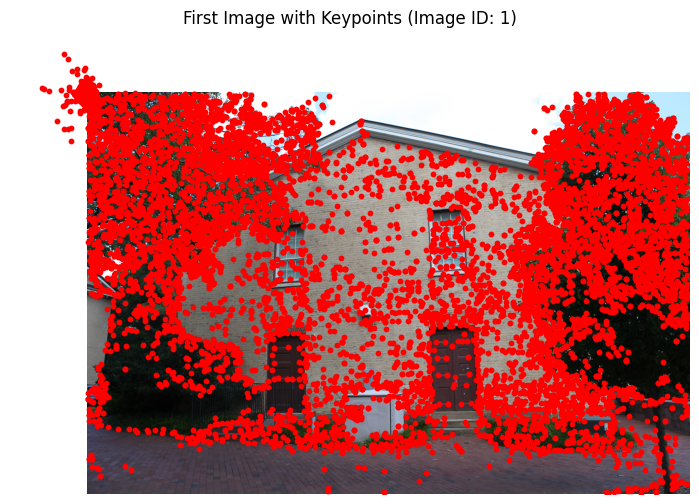

In [45]:
from PIL import Image
# Load the first image using its path
first_image_path = f"./images/{images[first_image_id].name}"

first_image = np.array(Image.open(first_image_path))  # Load image as a NumPy array

# Get keypoints for the first image
first_image_keypoints = keypoints[first_image_id]

# Plot the image with keypoints
plt.figure(figsize=(10, 6))
plt.imshow(first_image)  # Display the image
plt.scatter(first_image_keypoints[:, 0], first_image_keypoints[:, 1], c='red', s=10, marker='o')  # Plot keypoints
plt.title(f'First Image with Keypoints (Image ID: {first_image_id})')
plt.axis('off')  # Hide axes
plt.show()

## 2.4 Create a visualization for the number of matches between all images. (1.0)
For example: https://seaborn.pydata.org/generated/seaborn.heatmap.html

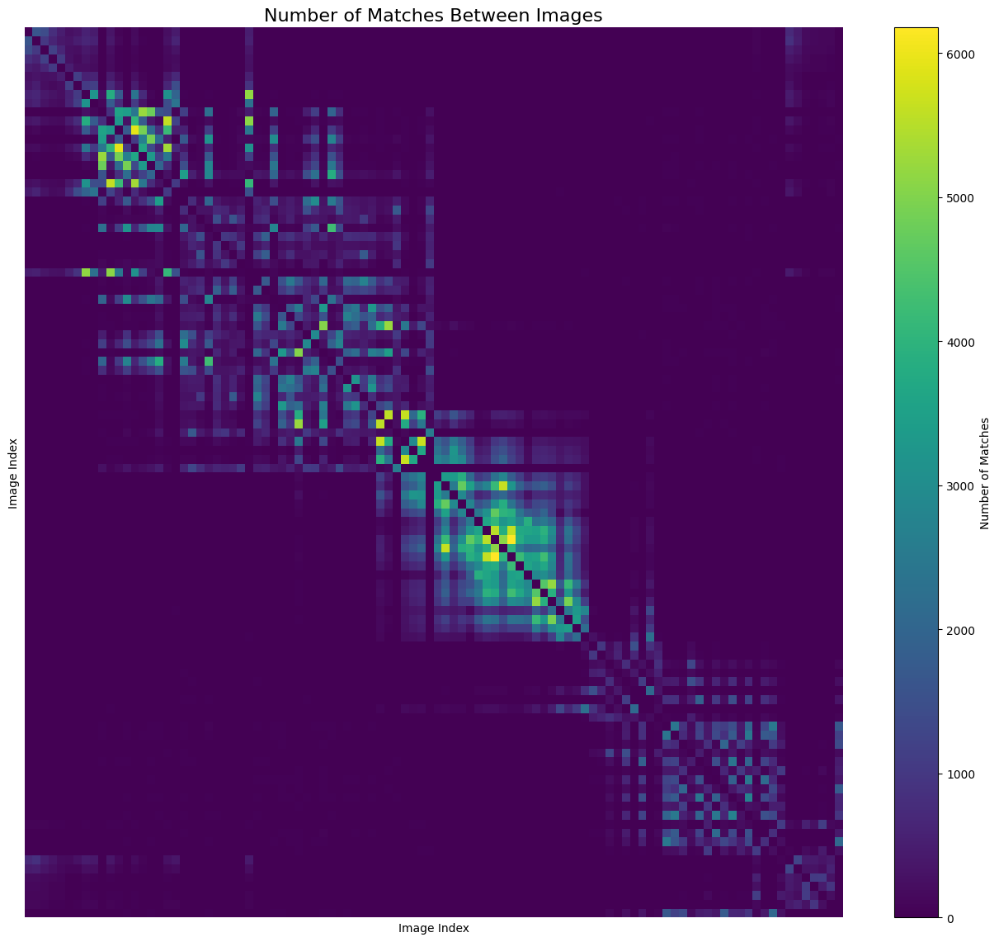

In [57]:
import seaborn as sns
# Determine the number of images
image_ids = set([i for key in matches.keys() for i in key])
num_images = max(image_ids)

# Initialize the matrix
match_matrix = np.zeros((num_images, num_images), dtype=int)

# Fill the matrix with the number of matches
for (i, j), points in matches.items():
    match_matrix[i-1, j-1] = len(points)  # Adjusting for 0-based indexing
    match_matrix[j-1, i-1] = len(points)  # Symmetric matrix

# Plot the heatmap
plt.figure(figsize=(16, 14))  
heatmap = sns.heatmap(
    match_matrix, 
    cmap="viridis", 
    cbar=False, 
    xticklabels=False,  
    yticklabels=False   
)
plt.colorbar(heatmap.collections[0], label="Number of Matches")  # Add manual colorbar
plt.title("Number of Matches Between Images", fontsize=16)
plt.xlabel("Image Index")
plt.ylabel("Image Index")
plt.show()

## 2.5 Visualize the keypoints and matches between the two images used in lab 3 using Colmap, how it compares to the results from lab 3? (1.0)
#### <span style='color:Green'> You can use the GUI to get the keypoints and matches and then visualize it here, following the same style as in lab 3 to get comparable results. </span>

In [20]:
### TO DO 2.5

## 2.6 Triangulate and visualize the 3D points from the keypoints extracted using Colmap on the two images used in lab 3, how it compares to the results from lab 3? (1.0) 
#### <span style='color:Green'> - Use the triangulation from lab 3 to the get the 3D points and visualize them following the same style. </span>

In [21]:
### TO DO 2.6

## 2.7 Visualize the sparse reconstruction using the 2 images from lab 3, and the complete CASTLE dataset. Comment on the differences between techniques and number of images used. (1.0)
#### <span style='color:Green'> - Use the reconstruction from Colmap to the get the 3D points and visualize them following the same style, using two images and the complete dataset. </span>

In [22]:
### TO DO 2.7